### Imports

In [260]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_validate, cross_val_score
from sklearn.metrics import plot_roc_curve
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import spacy 
import nltk
from nltk.collocations import *
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from  nltk import FreqDist

import string
import contractions

from scipy.sparse import csr_matrix

from xgboost import XGBClassifier 

In [3]:
sns.set_style("white")

### FUNCTIONS

In [5]:
def evaluate(model, X_val, y_val, y_preds):
    """
    DOCSTRING: 
    evaluate expects a model, a list of y_trues and associated list of 
    y_predicted. it outputs a confusion matrix of PRECICSION values (noramalize is
    set to 'preds') and the associated precision, recall, f1 and support scores
    """

    lables = ['Negative Sentiment', 'Positive Sentiment']    
    
    ROC_AUC = metrics.plot_roc_curve(estimator = model, X = X_val, y = y_val)
    
    raw_report = classification_report(y_val, y_preds,
                                               output_dict = True,
                                              target_names = lables)

    full_report = classification_report(y_val, y_preds, target_names = lables)
    
    print(ROC_AUC);
    print('************************************************************')
    print('METRICS')
    print('************************************************************')
    print("FULL REPORT")
    print(full_report)

In [6]:
df = pd.read_csv('without_voting.csv')
df = df.drop(columns='Unnamed: 0')
df.head()

,text,screen_name,user_description,favourite_count,retweet_count,created_at,replying_to,media,hashtags,urls,user_mentions,is_quote,is_retweet,text_blob,bert,vader_compound,bert_label
0,“#Florida's death toll from #HurricaneIan tops...,AmPowerBlog,Sports Twitter is the best Twitter. 🏈🏇🎾🛹⚾🏌️😎🚴🏐...,0,0,2022-10-03 20:19:43+00:00,NaN,False,"[{'text': 'Florida', 'indices': [1, 9]}, {'tex...","[{'url': 'https://t.co/RqcyAHAxtk', 'expanded_...",[],False,False,0.000000,"[{'label': 'Positive', 'score': 0.352827787399...",-0.1531,Positive
1,Republicans. can’t. be. counted. on. to. do. ...,nivnos33,#RESISTER #Woke #Democrat #NeverGOP #VotingRig...,0,0,2022-10-03 20:19:22+00:00,NaN,False,"[{'text': 'VoteOutEveryRepublican', 'indices':...","[{'url': 'https://t.co/Me3qmrzTsX', 'expanded_...",[],True,False,0.285714,"[{'label': 'Neutral', 'score': 0.3550549745559...",0.0000,Neutral
2,Leadership you can Trust. 🦟 Make sure to like ...,TrishTheCommish,"#Commissioner, #Mom, #PublicServant, #Mosquito...",2,0,2022-10-03 20:19:09+00:00,NaN,True,"[{'text': 'leadbyexample', 'indices': [180, 19...",[],[],False,False,0.625000,"[{'label': 'Neutral', 'score': 0.4122076034545...",0.9134,Neutral
3,"Hello Everyone,\n1/3) Many Floridians face flo...",Find_and_Bind1,"Amateur journalist, photographer, #bondage ent...",0,0,2022-10-03 20:18:56+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [112, 125...","[{'url': 'https://t.co/lgO1y1sFsK', 'expanded_...",[],False,False,0.500000,"[{'label': 'Positive', 'score': 0.351958453655...",-0.3182,Positive
4,"Lord, please be a refuge for those in need. Gi...",shellsfaith,My name is Shelly and this is where I will be ...,1,0,2022-10-03 20:18:45+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [195, 208...","[{'url': 'https://t.co/M4c6nH2x1U', 'expanded_...",[],True,False,-0.200000,"[{'label': 'Neutral', 'score': 0.3944049477577...",0.7579,Neutral


### Voting

In [7]:
df = df.drop(columns = ['bert_label'])
df.head()

,text,screen_name,user_description,favourite_count,retweet_count,created_at,replying_to,media,hashtags,urls,user_mentions,is_quote,is_retweet,text_blob,bert,vader_compound
0,“#Florida's death toll from #HurricaneIan tops...,AmPowerBlog,Sports Twitter is the best Twitter. 🏈🏇🎾🛹⚾🏌️😎🚴🏐...,0,0,2022-10-03 20:19:43+00:00,NaN,False,"[{'text': 'Florida', 'indices': [1, 9]}, {'tex...","[{'url': 'https://t.co/RqcyAHAxtk', 'expanded_...",[],False,False,0.000000,"[{'label': 'Positive', 'score': 0.352827787399...",-0.1531
1,Republicans. can’t. be. counted. on. to. do. ...,nivnos33,#RESISTER #Woke #Democrat #NeverGOP #VotingRig...,0,0,2022-10-03 20:19:22+00:00,NaN,False,"[{'text': 'VoteOutEveryRepublican', 'indices':...","[{'url': 'https://t.co/Me3qmrzTsX', 'expanded_...",[],True,False,0.285714,"[{'label': 'Neutral', 'score': 0.3550549745559...",0.0000
2,Leadership you can Trust. 🦟 Make sure to like ...,TrishTheCommish,"#Commissioner, #Mom, #PublicServant, #Mosquito...",2,0,2022-10-03 20:19:09+00:00,NaN,True,"[{'text': 'leadbyexample', 'indices': [180, 19...",[],[],False,False,0.625000,"[{'label': 'Neutral', 'score': 0.4122076034545...",0.9134
3,"Hello Everyone,\n1/3) Many Floridians face flo...",Find_and_Bind1,"Amateur journalist, photographer, #bondage ent...",0,0,2022-10-03 20:18:56+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [112, 125...","[{'url': 'https://t.co/lgO1y1sFsK', 'expanded_...",[],False,False,0.500000,"[{'label': 'Positive', 'score': 0.351958453655...",-0.3182
4,"Lord, please be a refuge for those in need. Gi...",shellsfaith,My name is Shelly and this is where I will be ...,1,0,2022-10-03 20:18:45+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [195, 208...","[{'url': 'https://t.co/M4c6nH2x1U', 'expanded_...",[],True,False,-0.200000,"[{'label': 'Neutral', 'score': 0.3944049477577...",0.7579


In [8]:
bert_scores = [x.split(' ')[3][:-2] for x in df['bert']]
df['bert_scores'] = bert_scores
df = df.drop(columns = 'bert')
df.head()

,text,screen_name,user_description,favourite_count,retweet_count,created_at,replying_to,media,hashtags,urls,user_mentions,is_quote,is_retweet,text_blob,vader_compound,bert_scores
0,“#Florida's death toll from #HurricaneIan tops...,AmPowerBlog,Sports Twitter is the best Twitter. 🏈🏇🎾🛹⚾🏌️😎🚴🏐...,0,0,2022-10-03 20:19:43+00:00,NaN,False,"[{'text': 'Florida', 'indices': [1, 9]}, {'tex...","[{'url': 'https://t.co/RqcyAHAxtk', 'expanded_...",[],False,False,0.000000,-0.1531,0.352827787399292
1,Republicans. can’t. be. counted. on. to. do. ...,nivnos33,#RESISTER #Woke #Democrat #NeverGOP #VotingRig...,0,0,2022-10-03 20:19:22+00:00,NaN,False,"[{'text': 'VoteOutEveryRepublican', 'indices':...","[{'url': 'https://t.co/Me3qmrzTsX', 'expanded_...",[],True,False,0.285714,0.0000,0.35505497455596924
2,Leadership you can Trust. 🦟 Make sure to like ...,TrishTheCommish,"#Commissioner, #Mom, #PublicServant, #Mosquito...",2,0,2022-10-03 20:19:09+00:00,NaN,True,"[{'text': 'leadbyexample', 'indices': [180, 19...",[],[],False,False,0.625000,0.9134,0.41220760345458984
3,"Hello Everyone,\n1/3) Many Floridians face flo...",Find_and_Bind1,"Amateur journalist, photographer, #bondage ent...",0,0,2022-10-03 20:18:56+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [112, 125...","[{'url': 'https://t.co/lgO1y1sFsK', 'expanded_...",[],False,False,0.500000,-0.3182,0.3519584536552429
4,"Lord, please be a refuge for those in need. Gi...",shellsfaith,My name is Shelly and this is where I will be ...,1,0,2022-10-03 20:18:45+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [195, 208...","[{'url': 'https://t.co/M4c6nH2x1U', 'expanded_...",[],True,False,-0.200000,0.7579,0.39440494775772095


In [9]:
voting_df =  [df['text_blob'], df['vader_compound'], df['bert_scores']]
voting_df = pd.DataFrame(voting_df).transpose()
voting_df

,text_blob,vader_compound,bert_scores
0,0,-0.1531,0.352827787399292
1,0.285714,0,0.35505497455596924
2,0.625,0.9134,0.41220760345458984
3,0.5,-0.3182,0.3519584536552429
4,-0.2,0.7579,0.39440494775772095
...,...,...,...
7647,0,0.3612,0.39361315965652466
7648,0,0.8394,0.38092079758644104
7649,0.8,0.8957,0.3929575979709625
7650,0.125,-0.6476,0.3635033667087555


In [10]:
standard_scaler = StandardScaler()

scaled_voting_df = pd.DataFrame(standard_scaler.fit_transform(voting_df))
scaled_voting_df

,0,1,2
0,-0.369372,-0.450888,-1.205824
1,0.690463,-0.162506,-1.113238
2,1.949018,1.557994,1.262663
3,1.485340,-0.761874,-1.241964
4,-1.111258,1.265091,0.522586
...,...,...,...
7647,-0.369372,0.517858,0.489670
7648,-0.369372,1.418606,-0.037966
7649,2.598168,1.524654,0.462418
7650,0.094306,-1.382339,-0.762028


In [11]:
scaled_voting_df['final_score'] = scaled_voting_df[0] + scaled_voting_df[1] + scaled_voting_df[2]
scaled_voting_df.head()

,0,1,2,final_score
0,-0.369372,-0.450888,-1.205824,-2.026085
1,0.690463,-0.162506,-1.113238,-0.585280
2,1.949018,1.557994,1.262663,4.769675
3,1.485340,-0.761874,-1.241964,-0.518498
4,-1.111258,1.265091,0.522586,0.676419


<AxesSubplot: xlabel='final_score', ylabel='Count'>

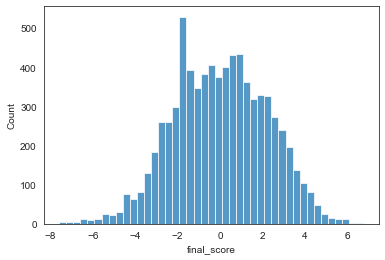

In [12]:
sns.histplot(scaled_voting_df['final_score'])

In [13]:
labels = []

for x in scaled_voting_df['final_score']:
    if x > 0:
        labels.append(1)
    else:
        labels.append(0)
df['labels'] = labels
df.head()

,text,screen_name,user_description,favourite_count,retweet_count,created_at,replying_to,media,hashtags,urls,user_mentions,is_quote,is_retweet,text_blob,vader_compound,bert_scores,labels
0,“#Florida's death toll from #HurricaneIan tops...,AmPowerBlog,Sports Twitter is the best Twitter. 🏈🏇🎾🛹⚾🏌️😎🚴🏐...,0,0,2022-10-03 20:19:43+00:00,NaN,False,"[{'text': 'Florida', 'indices': [1, 9]}, {'tex...","[{'url': 'https://t.co/RqcyAHAxtk', 'expanded_...",[],False,False,0.000000,-0.1531,0.352827787399292,0
1,Republicans. can’t. be. counted. on. to. do. ...,nivnos33,#RESISTER #Woke #Democrat #NeverGOP #VotingRig...,0,0,2022-10-03 20:19:22+00:00,NaN,False,"[{'text': 'VoteOutEveryRepublican', 'indices':...","[{'url': 'https://t.co/Me3qmrzTsX', 'expanded_...",[],True,False,0.285714,0.0000,0.35505497455596924,0
2,Leadership you can Trust. 🦟 Make sure to like ...,TrishTheCommish,"#Commissioner, #Mom, #PublicServant, #Mosquito...",2,0,2022-10-03 20:19:09+00:00,NaN,True,"[{'text': 'leadbyexample', 'indices': [180, 19...",[],[],False,False,0.625000,0.9134,0.41220760345458984,1
3,"Hello Everyone,\n1/3) Many Floridians face flo...",Find_and_Bind1,"Amateur journalist, photographer, #bondage ent...",0,0,2022-10-03 20:18:56+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [112, 125...","[{'url': 'https://t.co/lgO1y1sFsK', 'expanded_...",[],False,False,0.500000,-0.3182,0.3519584536552429,0
4,"Lord, please be a refuge for those in need. Gi...",shellsfaith,My name is Shelly and this is where I will be ...,1,0,2022-10-03 20:18:45+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [195, 208...","[{'url': 'https://t.co/M4c6nH2x1U', 'expanded_...",[],True,False,-0.200000,0.7579,0.39440494775772095,1


In [14]:
df = df.drop(columns=['text_blob', 'vader_compound', 'bert_scores'])

In [15]:
df['labels'].value_counts(normalize = True) 
# Classes for the target are balenced roughly, the difference is off by about 5% which is negligable 

1    0.502222
0    0.497778
Name: labels, dtype: float64

In [16]:
# instantiating nlp and stopwords

nlp = spacy.load('en_core_web_sm')

stopwords = nlp.Defaults.stop_words

stopwords.add("\n")
stopwords.add("\n\n")
stopwords.add("hurricaneian")
stopwords.add('ian')
stopwords.add('hurricane')
stopwords.add('florida')

for x in string.punctuation:
    stopwords.add(x)
    
for x in string.digits:
    stopwords.add(x)

print(stopwords)

{'|', 'always', 'per', 'everything', 'put', 'really', '-', 'indeed', 'thereby', 'within', 'six', 'top', 'keep', "'", 'either', '[', 'anything', 'must', 'nine', "'d", 'me', 'among', 'hers', 'whither', 'ever', 'whence', 'thereupon', 'less', 'well', 'myself', 'herein', 'own', 'become', 'using', 'then', '!', 'unless', 'elsewhere', '+', 'and', 'hundred', 'sometime', 'bottom', 'or', 'towards', 'n’t', '*', 'ours', 'could', 'be', 'over', 'show', 'third', 'rather', 'wherever', 'latter', '‘m', 'they', 'your', 'neither', 'herself', 'without', 'such', "'ll", '`', 'below', 'wherein', 'anyone', 'thru', 'around', 'behind', 'i', 'most', 'nobody', 'almost', 'onto', 'ca', 'during', 'yet', 'namely', '\n', 'more', '~', '‘ve', '=', 'front', 'one', 'hereby', 'see', '(', 'all', 'amount', 'too', 'is', 'else', 'twelve', 'several', 'seemed', 'before', 'two', 'which', 'than', 'his', 'was', 'of', '’ve', 'out', 'will', 'may', '’ll', 'whose', 'every', 'once', 'same', '’d', 'only', ']', 'toward', 'thereafter', 'beyo

In [17]:
list_of_doc_tokens = []
for text in df['text']:
    tokens_in_text = []
    new_text = contractions.fix(text)
    doc = nlp(new_text)
    for token in doc:
        if not token.is_punct and token.lemma_ != '-PRON-' and not token.like_num\
        and not token.like_url:
            tokens_in_text.append(token.lemma_.lower().strip())

    tokens_in_text = [token.translate(str.maketrans('', '', string.punctuation)) for token in tokens_in_text]
    tokens_in_text = [token.translate(str.maketrans('', '', string.digits)) for token in tokens_in_text]
    tokens_in_text = [token for token in tokens_in_text if token not in set(stopwords)]
    
    blank = ''
    tokens_in_text = [token for token in tokens_in_text if token is not blank]
    list_of_doc_tokens.append(tokens_in_text)

df['tokens'] = list_of_doc_tokens
df.head()

,text,screen_name,user_description,favourite_count,retweet_count,created_at,replying_to,media,hashtags,urls,user_mentions,is_quote,is_retweet,labels,tokens
0,“#Florida's death toll from #HurricaneIan tops...,AmPowerBlog,Sports Twitter is the best Twitter. 🏈🏇🎾🛹⚾🏌️😎🚴🏐...,0,0,2022-10-03 20:19:43+00:00,NaN,False,"[{'text': 'Florida', 'indices': [1, 9]}, {'tex...","[{'url': 'https://t.co/RqcyAHAxtk', 'expanded_...",[],False,False,0,"[s, death, toll, search, survivor, continue, f..."
1,Republicans. can’t. be. counted. on. to. do. ...,nivnos33,#RESISTER #Woke #Democrat #NeverGOP #VotingRig...,0,0,2022-10-03 20:19:22+00:00,NaN,False,"[{'text': 'VoteOutEveryRepublican', 'indices':...","[{'url': 'https://t.co/Me3qmrzTsX', 'expanded_...",[],True,False,0,"[republican, count, right, thing, 🧐, voteoutev..."
2,Leadership you can Trust. 🦟 Make sure to like ...,TrishTheCommish,"#Commissioner, #Mom, #PublicServant, #Mosquito...",2,0,2022-10-03 20:19:09+00:00,NaN,True,"[{'text': 'leadbyexample', 'indices': [180, 19...",[],[],False,False,1,"[leadership, trust, 🦟, sure, like, commissione..."
3,"Hello Everyone,\n1/3) Many Floridians face flo...",Find_and_Bind1,"Amateur journalist, photographer, #bondage ent...",0,0,2022-10-03 20:18:56+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [112, 125...","[{'url': 'https://t.co/lgO1y1sFsK', 'expanded_...",[],False,False,0,"[hello, floridians, face, flood, damage, flood..."
4,"Lord, please be a refuge for those in need. Gi...",shellsfaith,My name is Shelly and this is where I will be ...,1,0,2022-10-03 20:18:45+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [195, 208...","[{'url': 'https://t.co/M4c6nH2x1U', 'expanded_...",[],True,False,1,"[lord, refuge, need, comfort, presence, bring,..."


### EDA on Negative and Positive Sentiment

In [18]:
import re
import pickle
import demoji

demoji.download_codes

# 'Emoji_Dict.p'- download link https://drive.google.com/open?id=1G1vIkkbqPBYPKHcQ8qy0G2zkoab2Qv4v
with open('Emoji_Dict.p', 'rb') as fp:
    Emoji_Dict = pickle.load(fp)
Emoji_Dict = {v: k for k, v in Emoji_Dict.items()}

def convert_emojis_to_word(text):
    for emot in Emoji_Dict:
        text = re.sub(r'('+emot+')', "_".join(Emoji_Dict[emot].replace(",","").replace(":","").split()), text)
    return text

list_of_no_emoji_strings = []

for x in df['tokens']:
    string_of_tokens = " ".join(x)
    string_of_tokens = convert_emojis_to_word(string_of_tokens)
    emoji_dict = demoji.findall(string_of_tokens)
    for key, value in emoji_dict.items():
        if key in string_of_tokens:
            string_of_tokens = string_of_tokens.replace(key, value)
    list_of_no_emoji_strings.append(string_of_tokens)
    
   
df['no_emojis_string'] = list_of_no_emoji_strings
df.head()

,text,screen_name,user_description,favourite_count,retweet_count,created_at,replying_to,media,hashtags,urls,user_mentions,is_quote,is_retweet,labels,tokens,no_emojis_string
0,“#Florida's death toll from #HurricaneIan tops...,AmPowerBlog,Sports Twitter is the best Twitter. 🏈🏇🎾🛹⚾🏌️😎🚴🏐...,0,0,2022-10-03 20:19:43+00:00,NaN,False,"[{'text': 'Florida', 'indices': [1, 9]}, {'tex...","[{'url': 'https://t.co/RqcyAHAxtk', 'expanded_...",[],False,False,0,"[s, death, toll, search, survivor, continue, f...",s death toll search survivor continue fortmyer...
1,Republicans. can’t. be. counted. on. to. do. ...,nivnos33,#RESISTER #Woke #Democrat #NeverGOP #VotingRig...,0,0,2022-10-03 20:19:22+00:00,NaN,False,"[{'text': 'VoteOutEveryRepublican', 'indices':...","[{'url': 'https://t.co/Me3qmrzTsX', 'expanded_...",[],True,False,0,"[republican, count, right, thing, 🧐, voteoutev...",republican count right thing face with monocle...
2,Leadership you can Trust. 🦟 Make sure to like ...,TrishTheCommish,"#Commissioner, #Mom, #PublicServant, #Mosquito...",2,0,2022-10-03 20:19:09+00:00,NaN,True,"[{'text': 'leadbyexample', 'indices': [180, 19...",[],[],False,False,1,"[leadership, trust, 🦟, sure, like, commissione...",leadership trust mosquito sure like commission...
3,"Hello Everyone,\n1/3) Many Floridians face flo...",Find_and_Bind1,"Amateur journalist, photographer, #bondage ent...",0,0,2022-10-03 20:18:56+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [112, 125...","[{'url': 'https://t.co/lgO1y1sFsK', 'expanded_...",[],False,False,0,"[hello, floridians, face, flood, damage, flood...",hello floridians face flood damage flood insur...
4,"Lord, please be a refuge for those in need. Gi...",shellsfaith,My name is Shelly and this is where I will be ...,1,0,2022-10-03 20:18:45+00:00,NaN,False,"[{'text': 'HurricaneIan', 'indices': [195, 208...","[{'url': 'https://t.co/M4c6nH2x1U', 'expanded_...",[],True,False,1,"[lord, refuge, need, comfort, presence, bring,...",lord refuge need comfort presence bring peace ...


In [19]:
no_emoji_tokens = [x.split() for x in df['no_emojis_string']]
df['no_emojis_tokens'] = no_emoji_tokens

In [20]:
neg_df = df.loc[df['labels'] == 0]
pos_df = df.loc[df['labels'] == 1]

In [21]:
nlp.max_length = 1200000

In [22]:
def most_common(doc_string, sentiment_name):
    sns.set_style('white')
    doc = nlp(doc_string)

    tokens = [token.text for token in doc]

    freqdist = FreqDist(tokens)

    most_common = freqdist.most_common(20)
    most_common_df = pd.DataFrame(most_common)
    most_common_df.head()
    
    
    plt.figure(figsize = (8, 8))
    plt.xticks(rotation=45)

    top_20 = sns.barplot(x = 0, y = 1, data = most_common_df, color= 'blue')
    top_20.set_xlabel(f"Most Common Words in {sentiment_name}")
    top_20.set_ylabel("Frequencies")
    top_20.set_title("Top 20 Words in Hurricane Ian Tweets");

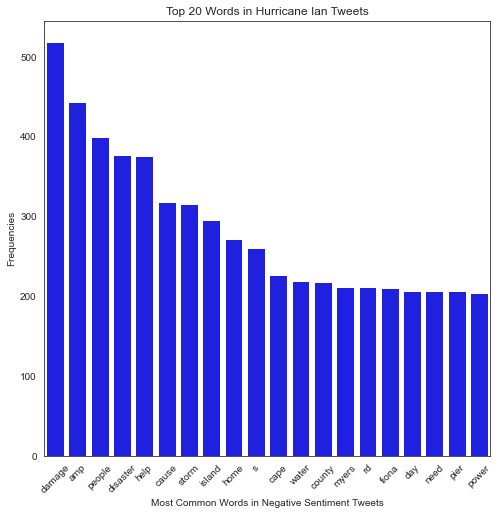

In [23]:
neg_doc_string = " ".join([x for x in neg_df['no_emojis_string']])
most_common(neg_doc_string, "Negative Sentiment Tweets")

/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/IPython/core/events.py:88: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from current font.
  func(*args, **kwargs)
/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


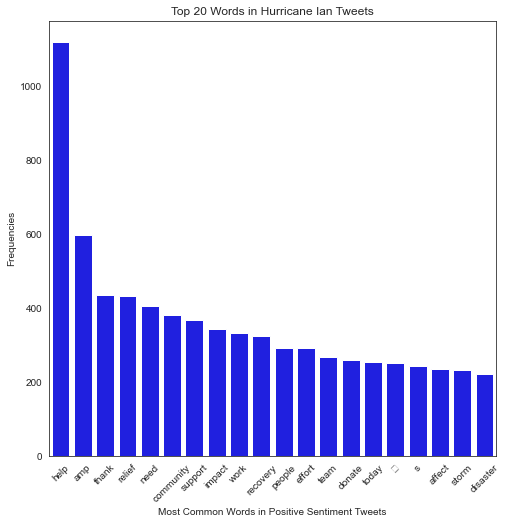

In [24]:
pos_doc_string = " ".join([x for x in pos_df['no_emojis_string']])
most_common(pos_doc_string, "Positive Sentiment Tweets")

In [25]:
def bigrams(sentiment_tokens, sentiment_name):

    bigram_measures = nltk.collocations.BigramAssocMeasures()
    finder = BigramCollocationFinder.from_words(sentiment_tokens)
    scored = finder.score_ngrams(bigram_measures.raw_freq)
    top_20_bigram = pd.DataFrame(scored[:20])
    top_20_bigram.head()
    
    bigrams = [str(x).strip('()').title() for x in top_20_bigram[0]]
    top_20_bigram[0] = bigrams
    top_20_bigram.head()
    
    
    plt.figure(figsize = (8, 8))
    plt.xticks(rotation=90)

    top_20 = sns.barplot(x = 0, y = 1, data = top_20_bigram, color= 'blue')
    top_20.set_xlabel("Bigrams")
    top_20.set_ylabel("Frequencies")
    top_20.set_title(f"Top 20 Two-Word Combinations in {sentiment_name}")

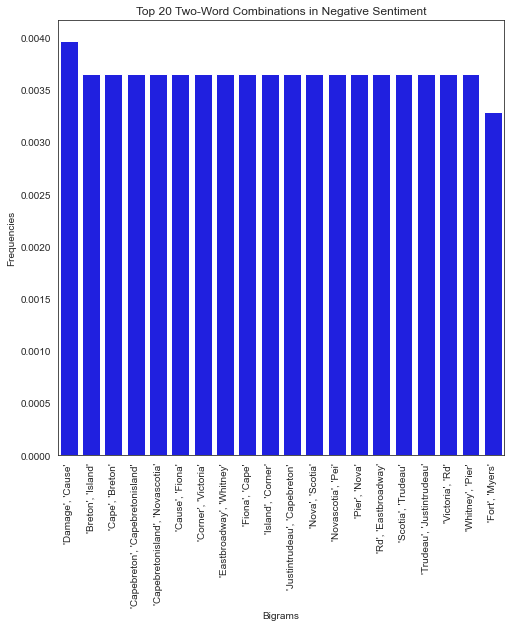

In [26]:
neg_tokens = [token for sublist in neg_df['no_emojis_tokens'] for token in sublist]

bigrams(neg_tokens, "Negative Sentiment")

/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/IPython/core/events.py:88: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from current font.
  func(*args, **kwargs)
/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


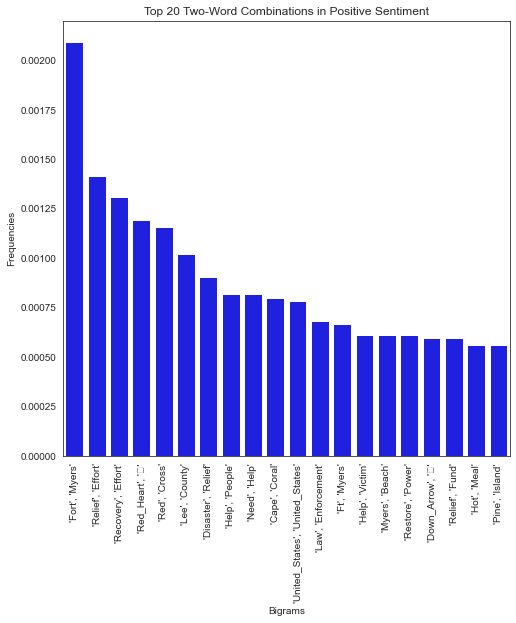

In [27]:
pos_tokens = [token for sublist in pos_df['no_emojis_tokens'] for token in sublist]

bigrams(pos_tokens, "Positive Sentiment")

In [28]:
def make_word_cloud(text):

    # Create and generate a word cloud image:
    wordcloud = WordCloud().generate(text)

    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bicubic', )
    plt.axis("off")
    plt.show()

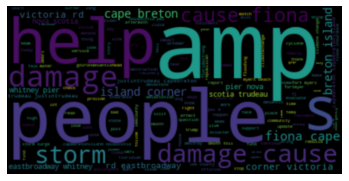

In [29]:
make_word_cloud(neg_doc_string)

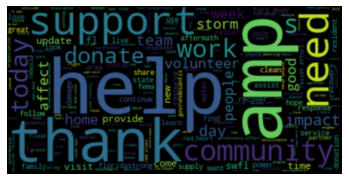

In [30]:
make_word_cloud(pos_doc_string)

### Train Test Split

In [31]:
X = df.drop([col for col in df.columns if 'no_emojis_string' not in col],axis = 1)
y = df['labels']

In [32]:
# In the first step we will split the data in training and remaining dataset
X_train, X_rem, y_train, y_rem = train_test_split(X,y, train_size=0.8)

# Now since we want the valid and test size to be equal (10% each of overall data). 
# we have to define valid_size=0.5 (that is 50% of remaining data)
test_size = 0.5
X_valid, X_test, y_valid, y_test = train_test_split(X_rem,y_rem, test_size=0.5)

print(X_train.shape)
print(X_test.shape)
print(X_valid.shape)

(6121, 1)
(766, 1)
(765, 1)


In [34]:
tfidf_vectorizer = TfidfVectorizer()

tfidf_vectorizer.fit(X_train['no_emojis_string'])
X_train_tfidf_vec = tfidf_vectorizer.transform(X_train['no_emojis_string'])
X_test_tfidf_vec = tfidf_vectorizer.transform(X_test['no_emojis_string'])
X_valid_tfidf_vec = tfidf_vectorizer.transform(X_valid['no_emojis_string'])
X_train_tfidf_vec_df = pd.DataFrame(X_train_tfidf_vec.toarray())
X_valid_tfidf_vec_df = pd.DataFrame(X_valid_tfidf_vec.toarray())
X_train_tfidf_vec_df.shape

(6121, 14009)

In [262]:
count_vectorizer = CountVectorizer()

count_vectorizer.fit(X_train['no_emojis_string'])
X_train_cv_vec = count_vectorizer.transform(X_train['no_emojis_string'])
X_test_cv_vec = count_vectorizer.transform(X_test['no_emojis_string'])
X_valid_cv_vec = count_vectorizer.transform(X_valid['no_emojis_string'])
X_train_cv_vec_df = pd.DataFrame(X_train_cv_vec.toarray())
X_valid_cv_vec_df = pd.DataFrame(X_valid_cv_vec.toarray())
X_train_cv_vec_df.shape

(6121, 14009)

In [35]:
print(X_train_tfidf_vec.shape)
print(X_test_tfidf_vec.shape)
print(X_valid_tfidf_vec.shape)

(6121, 14009)
(766, 14009)
(765, 14009)


In [263]:
print(X_train_cv_vec.shape)
print(X_test_cv_vec.shape)
print(X_valid_cv_vec.shape)

(6121, 14009)
(766, 14009)
(765, 14009)


### Random Forest Machine

In [36]:
rf_gscv_params = {
    'min_samples_split': [2, 3, 4, 5, 6],
    'min_samples_leaf' : [1, 2, 3, 4, 5, 6],
    'max_features' : ['sqrt'],
    'criterion': ["gini", "entropy"],
    'class_weight': ['balanced']}

#### TFIDF

In [265]:
rf_clf = RandomForestClassifier()

#Applying pipeline and grid for the Gridsearch
rf_gs_tfidf = GridSearchCV(estimator = rf_clf, param_grid = rf_gscv_params, scoring = 'f1', cv = 5)

#Fitting model with the training data
rf_gs_tfidf.fit(X_train_tfidf_vec, y_train)

KeyboardInterrupt: 

In [266]:
rf_gs_tfidf.best_params_

AttributeError: 'GridSearchCV' object has no attribute 'best_params_'

/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.94      0.91      0.93      3068
Positive Sentiment       0.91      0.94      0.93      3053

          accuracy                           0.93      6121
         macro avg       0.93      0.93      0.93      6121
      weighted avg       0.93      0.93      0.93      6121



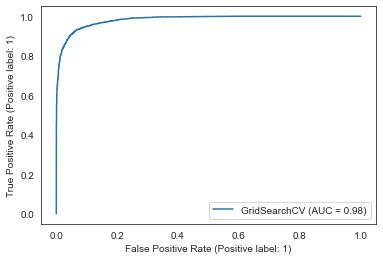

In [40]:
from sklearn import metrics

y_preds = rf_gs_with_cw.predict(X_train_tfidf_vec)

evaluate(rf_gs_with_cw, X_train_tfidf_vec, y_train, y_preds)

************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.79      0.77      0.78       365
Positive Sentiment       0.79      0.82      0.80       401

          accuracy                           0.79       766
         macro avg       0.79      0.79      0.79       766
      weighted avg       0.79      0.79      0.79       766



/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


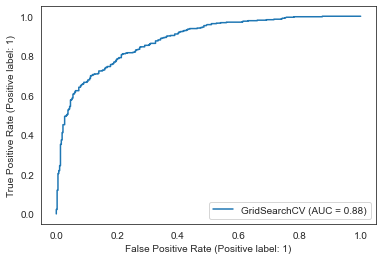

In [41]:
y_preds = rf_gs_with_cw.predict(X_test_tfidf_vec)

evaluate(rf_gs_with_cw, X_test_tfidf_vec, y_test, y_preds)

#### Count Vectorizer

In [267]:
rf_clf = RandomForestClassifier()

#Applying pipeline and grid for the Gridsearch
rf_gs_cv = GridSearchCV(estimator = rf_clf, param_grid = rf_gscv_params, scoring = 'f1', cv = 5)

#Fitting model with the training data
rf_gs_cv.fit(X_train_cv_vec, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'class_weight': ['balanced'],
                         'criterion': ['gini', 'entropy'],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6],
                         'min_samples_split': [2, 3, 4, 5, 6]},
             scoring='f1')

In [268]:
rf_gs_cv.best_params_

{'class_weight': 'balanced',
 'criterion': 'entropy',
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2}

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.


************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       1.00      1.00      1.00      3068
Positive Sentiment       1.00      1.00      1.00      3053

          accuracy                           1.00      6121
         macro avg       1.00      1.00      1.00      6121
      weighted avg       1.00      1.00      1.00      6121



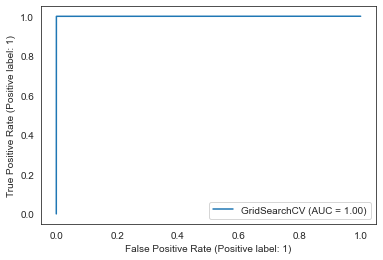

In [269]:
y_preds = rf_gs_cv.predict(X_train_cv_vec)

evaluate(rf_gs_cv, X_train_cv_vec, y_train, y_preds)

************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.78      0.82      0.80       365
Positive Sentiment       0.83      0.79      0.81       401

          accuracy                           0.80       766
         macro avg       0.80      0.80      0.80       766
      weighted avg       0.80      0.80      0.80       766



Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.


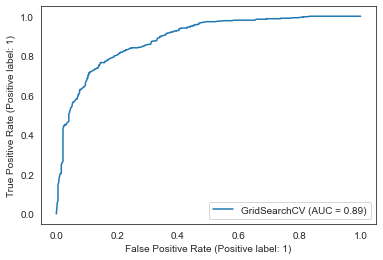

In [272]:
y_preds = rf_gs_cv.predict(X_test_cv_vec)

evaluate(rf_gs_cv, X_test_cv_vec, y_test, y_preds)

### XG BOOST Machine

In [42]:
#Importing Counter to do calculations for the weights for the model
from collections import Counter
counter = Counter(y)
# estimate scale_pos_weight value
estimate = counter[0] / counter[1]
print('Estimate: %.3f' % estimate)

Estimate: 0.991


In [43]:
#Setting of parameters for gridsearch to use
xgb_grid = {
    'learning_rate': [0.1, 0.3, 0.5, 0.7],
    'max_depth': [10, 11, 12, 13, 14],
    'min_child_weight': [1, 2],
    'subsample': [0.3, 0.5, 0.7],
    'n_estimators': [20, 25, 30]
}

#### TFIDF

In [44]:
xg_clf = XGBClassifier()

#Applying pipeline and grid for the Gridsearch
xg_gs_tfidf = GridSearchCV(estimator = xg_clf, param_grid = xgb_grid, scoring = 'f1', cv = 5)

#Fitting model with the training data
xg_gs_tfidf.fit(X_train_tfidf_vec, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, validate_parameters=None,
                                     verbosity=None),
             param_grid={'learning_rate': [0.1, 0.3, 0.5, 0.7],
                         'max_depth': [10, 11, 12, 13, 14],
                         'min_child_weight': [1, 2],
                         'n_estimators': [20, 25, 30],
                         'subsample': [0.3, 0.5, 0.7]},
             scoring='f1')

In [45]:
xg_gs_tfidf.best_params_

{'learning_rate': 0.5,
 'max_depth': 13,
 'min_child_weight': 1,
 'n_estimators': 30,
 'subsample': 0.7}

************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.87      0.92      0.89      3068
Positive Sentiment       0.91      0.87      0.89      3053

          accuracy                           0.89      6121
         macro avg       0.89      0.89      0.89      6121
      weighted avg       0.89      0.89      0.89      6121



/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


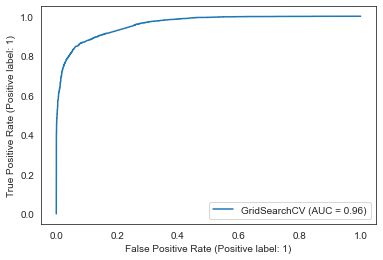

In [46]:
y_preds = xg_gs_tfidf.predict(X_train_tfidf_vec)
evaluate(xg_gf_tfidf, X_train_tfidf_vec, y_train, y_preds)

************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.74      0.79      0.76       365
Positive Sentiment       0.79      0.75      0.77       401

          accuracy                           0.77       766
         macro avg       0.77      0.77      0.77       766
      weighted avg       0.77      0.77      0.77       766



/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


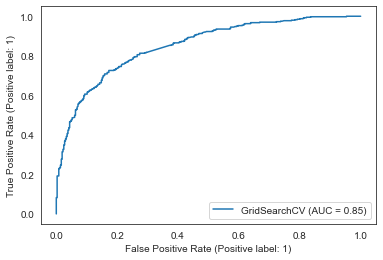

In [47]:
y_preds = xg_gs_tfidf.predict(X_test_tfidf_vec)
evaluate(xg_gs_tfidf, X_test_tfidf_vec, y_test, y_preds)

#### Count Vectorizer

In [273]:
#Applying pipeline and grid for the Gridsearch
xg_gs_cv = GridSearchCV(estimator = xg_clf, param_grid = xgb_grid, scoring = 'f1', cv = 5)

#Fitting model with the training data
xg_gs_cv.fit(X_train_cv_vec, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, validate_parameters=None,
                                     verbosity=None),
             param_grid={'learning_rate': [0.1, 0.3, 0.5, 0.7],
                         'max_depth': [10, 11, 12, 13, 14],
                         'min_child_weight': [1, 2],
                         'n_estimators': [20, 25, 30],
                         'subsample': [0.3, 0.5, 0.7]},
             scoring='f1')

In [274]:
xg_gs_cv.best_params_

{'learning_rate': 0.7,
 'max_depth': 13,
 'min_child_weight': 1,
 'n_estimators': 30,
 'subsample': 0.7}

************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.87      0.90      0.89      3068
Positive Sentiment       0.90      0.87      0.88      3053

          accuracy                           0.89      6121
         macro avg       0.89      0.89      0.89      6121
      weighted avg       0.89      0.89      0.89      6121



Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.


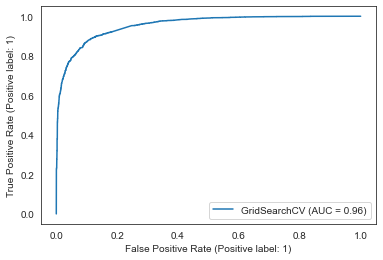

In [276]:
y_preds = xg_gs_cv.predict(X_train_cv_vec)
evaluate(xg_gs_cv, X_train_cv_vec, y_train, y_preds)

************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.77      0.79      0.78       365
Positive Sentiment       0.80      0.78      0.79       401

          accuracy                           0.78       766
         macro avg       0.78      0.78      0.78       766
      weighted avg       0.79      0.78      0.78       766



Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.


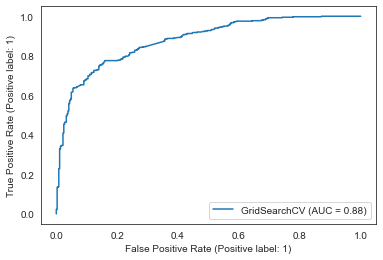

In [277]:
y_preds = xg_gs_cv.predict(X_test_cv_vec)
evaluate(xg_gs_cv, X_test_cv_vec, y_test, y_preds)

### Naive Bayes Machine

In [48]:
from sklearn.naive_bayes import MultinomialNB

#### TFIDF

In [49]:
nb_clf = MultinomialNB()

#Fitting model with the training data
nb_clf.fit(X_train_tfidf_vec.toarray(), y_train)

MultinomialNB()

In [50]:
nb_clf.get_params()

{'alpha': 1.0, 'class_prior': None, 'fit_prior': True}

/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.93      0.88      0.90      3068
Positive Sentiment       0.88      0.93      0.91      3053

          accuracy                           0.91      6121
         macro avg       0.91      0.91      0.91      6121
      weighted avg       0.91      0.91      0.91      6121



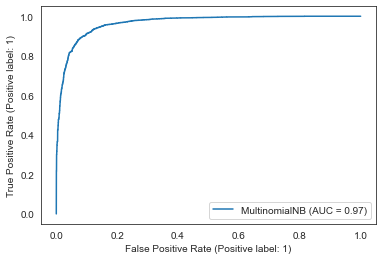

In [51]:
y_preds = nb_clf.predict(X_train_tfidf_vec.toarray())
evaluate(nb_clf, X_train_tfidf_vec.toarray(), y_train, y_preds)

************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.79      0.73      0.75       365
Positive Sentiment       0.77      0.82      0.79       401

          accuracy                           0.78       766
         macro avg       0.78      0.77      0.77       766
      weighted avg       0.78      0.78      0.77       766



/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


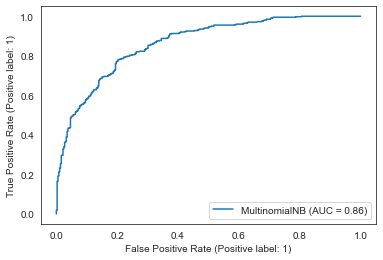

In [52]:
y_preds = nb_clf.predict(X_test_tfidf_vec.toarray())
evaluate(nb_clf, X_test_tfidf_vec.toarray(), y_test, y_preds)

#### Count Vectorizer

In [278]:
#Fitting model with the training data
nb_clf.fit(X_train_cv_vec.toarray(), y_train)

MultinomialNB()

In [279]:
nb_clf.get_params()

{'alpha': 1.0, 'class_prior': None, 'fit_prior': True}

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.


************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.93      0.87      0.90      3068
Positive Sentiment       0.88      0.93      0.91      3053

          accuracy                           0.90      6121
         macro avg       0.91      0.90      0.90      6121
      weighted avg       0.91      0.90      0.90      6121



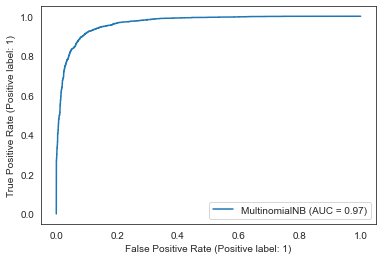

In [280]:
y_preds = nb_clf.predict(X_train_cv_vec.toarray())
evaluate(nb_clf, X_train_cv_vec.toarray(), y_train, y_preds)

************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.80      0.72      0.76       365
Positive Sentiment       0.77      0.84      0.80       401

          accuracy                           0.78       766
         macro avg       0.78      0.78      0.78       766
      weighted avg       0.78      0.78      0.78       766



Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.


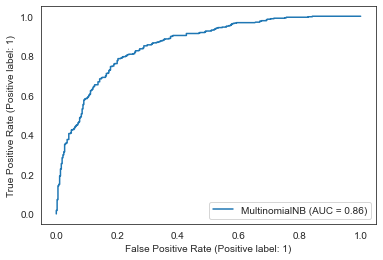

In [281]:
y_preds = nb_clf.predict(X_test_cv_vec.toarray())
evaluate(nb_clf, X_test_cv_vec.toarray(), y_test, y_preds)

### Cat Boost

In [288]:
cat_tfidf_train_df = pd.DataFrame(X_train_tfidf_vec.todense())
cat_tfidf_test_df = pd.DataFrame(X_test_tfidf_vec.todense())
cat_tfidf_val_df = pd.DataFrame(X_valid_tfidf_vec.todense())
cat_tfidf_train_df.head()

,0,1,2,3,4,5,6,7,8,9,...,13999,14000,14001,14002,14003,14004,14005,14006,14007,14008
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [289]:
cat_cv_train_df = pd.DataFrame(X_train_cv_vec.todense())
cat_cv_test_df = pd.DataFrame(X_test_cv_vec.todense())
cat_cv_val_df = pd.DataFrame(X_valid_cv_vec.todense())
cat_cv_train_df.head()

,0,1,2,3,4,5,6,7,8,9,...,13999,14000,14001,14002,14003,14004,14005,14006,14007,14008
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [304]:
from catboost import CatBoostClassifier
cat_boost_clf = CatBoostClassifier()

In [305]:
cat_boost_grid = {'iterations': [1000, 2000, 3000, 4000, 5000, 6000],
 'depth': [2, 3, 4, 5],
 'verbose': [False],
 'learning_rate': [0.01, 0.02, 0.03],
 'loss_function' : ['Logloss']}

#### TFIDF

In [292]:
#Applying pipeline and grid for the Gridsearch
cb_gs_tfidf = GridSearchCV(estimator = cat_boost_clf, param_grid = cat_boost_grid, scoring = 'f1', cv = 5)

#Fitting model with the training data
cb_gs_tfidf.fit(cat_tfidf_train_df, y_train)

KeyboardInterrupt: 

In [61]:
cb_gs_tfidf.best_params_

{'depth': 3,
 'iterations': 6000,
 'learning_rate': 0.03,
 'loss_function': 'Logloss',
 'verbose': 1000}

In [64]:
predict_probas = cb_gs_tfidf.predict_proba(cat_tfidf_train_df)
y_preds = []
for x in predict_probas:
    if x[0] > x[1]:
        y_preds.append(0)
    if x[0] < x[1]:
        y_preds.append(1)
        
print(y_preds[:10])

[1, 0, 0, 1, 1, 0, 0, 0, 0, 0]


/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.93      0.97      0.95      3068
Positive Sentiment       0.97      0.93      0.94      3053

          accuracy                           0.95      6121
         macro avg       0.95      0.95      0.95      6121
      weighted avg       0.95      0.95      0.95      6121



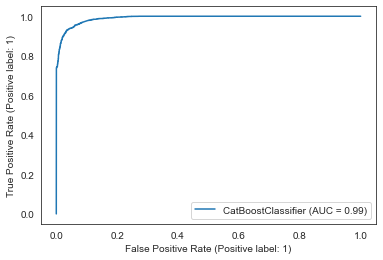

In [65]:
evaluate(cb_gs_tfidf, cat_tfidf_train_df, y_train, y_preds)

In [66]:
predict_probas = cb_clf.predict_proba(cat_tfidf_test_df)
y_preds = []
for x in predict_probas:
    if x[0] > x[1]:
        y_preds.append(0)
    if x[0] < x[1]:
        y_preds.append(1)
        
print(y_preds[:10])

[0, 0, 1, 0, 1, 1, 0, 1, 1, 0]


/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.77      0.85      0.80       365
Positive Sentiment       0.85      0.77      0.80       401

          accuracy                           0.80       766
         macro avg       0.81      0.81      0.80       766
      weighted avg       0.81      0.80      0.80       766



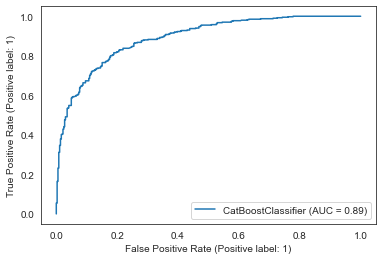

In [67]:
evaluate(cb_clf, cat_test_df, y_test, y_preds)

#### Count Vectorizer 

In [306]:
#Applying pipeline and grid for the Gridsearch
cb_gs_cv = GridSearchCV(estimator = cat_boost_clf, param_grid = cat_boost_grid, scoring = 'f1', cv = 5)

#Fitting model with the training data
cb_gs_cv.fit(cat_cv_train_df, y_train)

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x7fb963cbf8e0>,
             param_grid={'depth': [2, 3, 4, 5],
                         'iterations': [1000, 2000, 3000, 4000, 5000, 6000],
                         'learning_rate': [0.01, 0.02, 0.03],
                         'loss_function': ['Logloss'], 'verbose': [False]},
             scoring='f1')

In [307]:
cb_gs_cv.best_params_

{'depth': 4,
 'iterations': 5000,
 'learning_rate': 0.03,
 'loss_function': 'Logloss',
 'verbose': False}

In [308]:
predict_probas = cb_gs_cv.predict_proba(cat_cv_train_df)
y_preds = []
for x in predict_probas:
    if x[0] > x[1]:
        y_preds.append(0)
    if x[0] < x[1]:
        y_preds.append(1)
        
print(y_preds[:10])

[1, 0, 0, 1, 1, 0, 0, 0, 0, 0]


Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.


************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.98      1.00      0.99      3068
Positive Sentiment       1.00      0.98      0.99      3053

          accuracy                           0.99      6121
         macro avg       0.99      0.99      0.99      6121
      weighted avg       0.99      0.99      0.99      6121



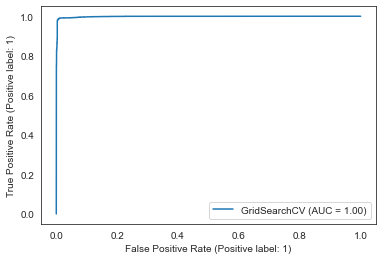

In [309]:
evaluate(cb_gs_cv, cat_cv_train_df, y_train, y_preds)

In [310]:
predict_probas = cb_clf.predict_proba(cat_cv_test_df)
y_preds = []
for x in predict_probas:
    if x[0] > x[1]:
        y_preds.append(0)
    if x[0] < x[1]:
        y_preds.append(1)
        
print(y_preds[:10])

[0, 1, 1, 0, 1, 1, 0, 1, 1, 0]


Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.


************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.74      0.84      0.79       365
Positive Sentiment       0.83      0.73      0.78       401

          accuracy                           0.78       766
         macro avg       0.79      0.78      0.78       766
      weighted avg       0.79      0.78      0.78       766



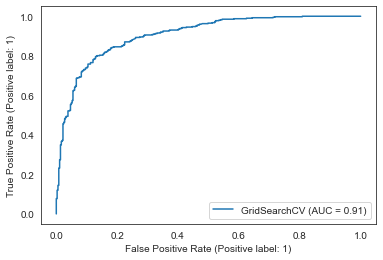

In [311]:
evaluate(cb_gs_cv, cat_cv_test_df, y_test, y_preds)

### Validation

************************************************************
METRICS
************************************************************
FULL REPORT
                    precision    recall  f1-score   support

Negative Sentiment       0.78      0.84      0.81       376
Positive Sentiment       0.84      0.77      0.80       389

          accuracy                           0.81       765
         macro avg       0.81      0.81      0.81       765
      weighted avg       0.81      0.81      0.81       765



/Users/b0ihazard/opt/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


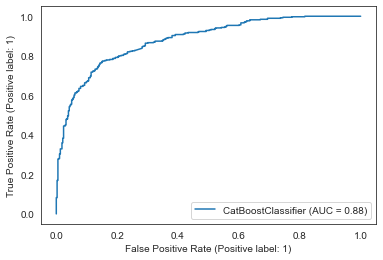

In [143]:
y_preds = cb_clf.predict(X_valid_tfidf_vec)
evaluate(cb_clf, X_valid_tfidf_vec, y_valid, y_preds)

### Explainer with Catboost

In [216]:
feature_importances = cb_clf.feature_importances_
feature_importances

array([0., 0., 0., ..., 0., 0., 0.])

In [217]:
for x in feature_importances[:100]:
    print(x)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.1072786442976979
0.0
0.0
0.0
0.0
0.002395170156238854
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.07920821694157841
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0017871205832420067
0.0
0.000517215207118581
0.0
0.0
0.0
0.006475905143902561
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.09908766910519169
0.0
0.0
0.0
0.0
0.001050812922109776
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.008867318352199489
0.0
0.0
0.0
0.010235596152133836
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.03234304791084496
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.013227439844859341
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.03321410984784352
0.00474957981983697
0.0


0.0
0.0
0.0
0.0010806795572968625
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.04028158612294245
0.0
0.0
0.0008061009695719604
0.0
0.0
0.09786430406046145
0.0
0.0
0.0
0.0
0.6947790417055185
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.002138356687749548
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0676284114022315
0.013005612892582103
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05233940939682871
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.000917004456399101
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.020711237647260045
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.007283284061390123
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.044572139627314857
0.005170792755845849
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.003443358112838145
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.15192272011532948
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0790749796769386
0.01130648784501172
0.004260998163532132
0.0
0.0
0.0
0.0
0.0
0.02587024305311736
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.01012277887102618
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.007572079667063166
0.0
0.0
0.0
0.0689314310879562
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.010562926136837595
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.018577367213875973
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.0
0.0
0.0
0.0
0.024381592422304515
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.31694659477710735
0.04027147216532123
0.0
0.0
0.041397588768890686
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00016121230001594014
0.0
0.0
0.1159681795041441
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.22484548467969107
0.004000934905747447
0.0
0.0
0.007696302314107255
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.20142631491166615
0.03802429046460785
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.023754548389548748
0.0
0.0
0.0033492206662324637
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.006653138459408913
0.0
0.0
0.096870242085952
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.010522304809358035
0.0
0.0
0.010106731052601906
0.0
0.0
0.0
0.0
0.4011767834235141
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.08203689673869599
0.06738177834715704
0.0
0.0
0.0
0.0
0.0
0.0207842496941458
0.0
0.0
0.03017518284670472
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.18052183099354918
0.0
0.0
0.016989880950705024
0.0
0.0
0.0
0.020875573239583632
0.01362027004955851
0.0
0.028390804245541267
0.0
0.3091038773415974
0.0008452640997199023
0.0
0.0
0.021132539079444065
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0034381440793381933
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.01326750364455908
0.0
0.0
0.08899953877508347
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.07920069707533749
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.04945504196625637
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.

0.0
0.09452920014364309
0.0
0.0
0.0
0.16770138810322316
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.01325516445232197
0.0
0.11437465356752023
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0059125194487138245
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0035186163579349443
0.0
0.0
0.0
0.0
0.0
0.0
0.039905349019563906
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0029706227259900333
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0045306542901087125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.00033740050634473926
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.03336595736056395
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.002967547869443753
0.0
0.0

In [218]:
tokens_by_name = tfidf_vectorizer.get_feature_names_out(X_train_tfidf_vec)
tokens_by_name

array(['1st_place_medal', '_closed_eyes', '_cold_sweat', ...,
       '𝙩𝙚𝙢𝙥𝙤𝙧𝙖𝙧𝙞𝙡𝙮', '𝟖𝟔𝟔𝐑𝐎𝐎𝐅𝟑𝟐𝟐', '𝟖𝟔𝟔𝟓𝟓𝟎𝟐𝟗𝟐𝟗'], dtype=object)

In [219]:
feature_importances = list(zip(feature_importances, tokens_by_name))
feature_importances_df = pd.DataFrame(feature_importances)
feature_importances_df.head()

,0,1
0,0.0,1st_place_medal
1,0.0,_closed_eyes
2,0.0,_cold_sweat
3,0.0,_outlying_islands
4,0.0,_smiling_eyes


In [222]:
only_import = feature_importances_df.loc[feature_importances_df[0] != 0.0]
only_import

,0,1
32,0.107279,abcworldnews
37,0.002395,ableist
51,0.079208,absorb
99,0.001787,aclu
101,0.000517,acosgrove
...,...,...
13833,0.028333,teamiem
13840,0.011425,teamph
13855,0.156170,technical
13885,0.054986,tellmel


In [251]:
only_import[2] = only_import[0].astype(str) + ' ' + only_import[1]
most_important_terms = sorted(only_import[2], reverse = True)
top_50 = most_important_terms[:50]
top_50


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


'gamut costofrebuilde jampro schreiber businessloan painful contaminate darn rough cortez floridanationalguard following poetrygram marry customer hstfse attire ns alleviate shaky assignment favre cummin stopblockade bloodnow chuck steal cmorganwx influx pulmonaryhypertension celebratinglifestorie duystful fridaynight glfop rip diesantis cupcake custardcares science nopower customizable mouth jacksonwatercrisis energysecurity iamdjd sarahbellestone flsarc patientsfirst degrift insult'

In [ ]:
top_50_terms = [x.split(' ')[1] for x in top_50]
top_50_terms_string = " ".join(top_50_terms)
top_50_terms_string

### Explainer with Lime

In [144]:
X_sample_strings = [X['no_emojis_string'][x] for x in range(10)]
X_sample_strings

['s death toll search survivor continue fortmyers ftmyers',
 'republican count right thing face with monocle voteouteveryrepublican votethemallout backhand_index_pointing_down backhand_index_pointing_down backhand_index_pointing_down',
 'leadership trust mosquito sure like commissioner trish becker anastasia mosquito control district page share friend vote mail ballot today leadbyexample vote politic hurricanian staugustine woman mosquito',
 'hello floridians face flood damage flood insurance flooddamage insurance fema grant',
 'lord refuge need comfort presence bring peace strength carry midst trouble loss holy amen prayforflorida prayer',
 'fort myers beach town south west destroy follow deadly crew talk resident survivor picture capture ftmyersbeach fortmyers',
 'continue bring update aftermath fl news onscene update fortmyersbeach',
 'dwuhlfelderlaw sarahburris acosta soooo let straight people chance fraud commit election govrondesantis literally hide dead body person_facepalming \

In [145]:
from sklearn.pipeline import make_pipeline

pipeline = make_pipeline(tfidf_vectorizer, cb_clf)

In [258]:
sns.set_style('white')

from lime import lime_text

labels = ['Negative Sentiment', 'Positive Sentiment']
explainer = lime.lime_text.LimeTextExplainer(class_names = labels)

for x in X_sample_strings:
    exp = explainer.explain_instance(x, pipeline.predict_proba, num_features=5, top_labels=1)
    exp.show_in_notebook(text=True)

In [259]:
exp = explainer.explain_instance(top_50_terms_string, pipeline.predict_proba, num_features=50)
exp.show_in_notebook(text=True)